# Preâmbulo

Imports, argumentos e definição do device.

In [1]:
 # Basic imports.
import os
import time
import numpy as np
import torch

from torch import nn
from torch import optim
from torch.nn import functional as F

from torch.utils.data import DataLoader

from torchvision import models
from torchvision import datasets
from torchvision import transforms

from sklearn import metrics

from matplotlib import pyplot as plt

%matplotlib inline

# Setting predefined arguments.
args = {
    'epoch_num': 50,        # Number of epochs.
    # 'lr': 1e-3,             # Learning rate.
    'lr': 2e-4,             # Learning rate.
    'beta': 0.5,            # Beta1 from Adam.
    'n_workers': 2,         # Number of workers on data loader.
    'batch_size': 1000,     # Mini-batch size.
    'print_freq': 1,        # Printing frequency.
    'z_dim': 100,           # Dimension of z input vector.
    'n_samples': 10,        # Number of samples to be generated in evaluation.
    # 'least_squares': True   # Least Squares optimization.
    'least_squares': False  # Least Squares optimization.
}

if torch.cuda.is_available():
    args['device'] = torch.device('cuda')
else:
    args['device'] = torch.device('cpu')

print(args['device'])

cuda


# Carregando o conjunto de dados

In [2]:
# Root directory for the dataset (to be downloaded).
root = './'

# Transformations over the dataset.
data_transforms = transforms.Compose([ # MNIST transforms.
    transforms.Pad(2, fill=0),
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5)),
])

# Setting datasets and dataloaders.
args['n_channels'] = 1
args['n_classes'] = 10
args['img_size'] = 32
args['z_size'] = 2
train_set = datasets.MNIST(root,
                           train=True,
                           download=True,
                           transform=data_transforms)

# Setting dataloaders.
train_loader = DataLoader(train_set,
                          args['batch_size'],
                          num_workers=args['n_workers'],
                          shuffle=True) # MNIST

# Printing training and testing dataset sizes.
print('Size of training set: ' + str(len(train_set)) + ' samples')

Size of training set: 60000 samples


# Treinamento Adversarial Convolucional

Como desde o começo GANs foram pensadas para imagens primariamente, era de se esperar que convoluções fossem inseridas em algum momento. O artigo original das [GANs](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf), inclusive, contém testes entre arquiteturas parcialmente convolucionais e compostas apenas por camadas FC:

*   Resultados Fully Connected no CIFAR;
![FC GAN](https://www.dropbox.com/s/dbem2z7jjzodoyb/gan_fc_goodfellow.png?dl=1)
*   Resultados Convolutionais no CIFAR.
![Convolutional GAN](https://www.dropbox.com/s/z9ihvqb4a53eqvb/gan_conv_goodfellow.png?dl=1)

A arquitetura de $G$ lembra o Decoder de um VAE com camadas que partem de um vetor aleatório $z$ e geram uma amostra final sintética $x$. Já a arquitetura de $D$ lembra uma CNN tradicional para classificação de imagens, como a AlexNet, VGG, ResNet ou DenseNet que já vimos previamente no curso:

*   Arquitetura de uma Generativa $G$;
![Rede generativa.](https://www.dropbox.com/s/q6vm8czd7shozdp/GAN_G.png?dl=1)

*   Arquitetura de uma Generativa $D$;
![Rede discriminativa.](https://www.dropbox.com/s/u4zsh5bgy5hzf4c/GAN_D.png?dl=1)

Por muito tempo, porém, foi proibitivo criar GAN convolucionais com muitas camadas, pois haviam problemas sérios de convergência e instabilidade no treinamento. O artigo das [Deep Convolutional GANs](https://arxiv.org/pdf/1511.06434.pdf) mitigou a maior parte desses problemas, propondo uma arquitetura padrão, e hoje em dia é possível treinar uma Convolutional GAN com diversas camadas.

# Computando one-hot encodings para labels

In [3]:
# Predefining one-hot encodings for G and D inputs.
def one_hot_encodings(labs, batch_size, num_classes, img_size, z_size):

    # Create array filled zeros with dimensions (B, #Classes).
    batch_one_hot_g = torch.zeros(batch_size,
                                  num_classes,
                                  z_size,
                                  z_size).to(args['device'])
    
    # Create array filled zeros with dimensions (B, #Classes, 28, 28).
    batch_one_hot_d = torch.zeros(batch_size,
                                  num_classes,
                                  img_size,
                                  img_size).to(args['device'])
    
    # For each label in a sample in a batch, fill the corresponding other
    # dimensions in batch_one_hot_g and batch_one_hot_d with 1.
    for i in range(labs.size(0)):

        # Encoding to be fed together with z to G.
        batch_one_hot_g[i, labs[i], :, :].fill_(1.0)
        
        # Encoding to be fed together with G(z) to D.
        batch_one_hot_d[i, labs[i], :, :].fill_(1.0)
    
    return batch_one_hot_g, batch_one_hot_d

tensor([6, 5, 6, 6], device='cuda:0')
tensor([[[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[1., 1.],
          [1., 1.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[1., 1.],
          [1., 1.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0.,

# Demo: Implementando uma GAN Condicional

Nessa atividade implementaremos os principais elementos de uma DCGAN, incluindo sua arquitetura e procedimento de treino.

# Definindo uma inicialização de pesos customizada.

In [4]:
# Customized weight initialization.
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Definindo o Gerador $G$

In [5]:
# Adversarial Generator.
class Generator(nn.Module):
    
    def __init__(self, input_dim=100, n_classes=10, output_ch=1):
        
        super(Generator, self).__init__()
        
        self.input_dim = input_dim
        self.n_classes = n_classes
        self.output_ch = output_ch

        self.tconv = nn.Sequential(
            
            # Bloco 1: (B, n_Z + n_K, 2, 2) -> (B, 256, 4, 4)
            nn.ConvTranspose2d(self.input_dim + self.n_classes, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            # Bloco 2: (B, 256, 4, 4) -> (B, 128, 8, 8)
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            
            # Bloco 3: (B, 128, 8, 8) -> (B, 64, 16, 16)
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            
            # Bloco 4: (B, 64, 16, 16) -> (B, Ch, 32, 32)
            nn.ConvTranspose2d(64, self.output_ch, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh(),
        )
        
    def forward(self, z):
        
        x = self.tconv(z)
        
        return x

# Instantiating G.
net_G = Generator(input_dim=args['z_dim'], output_ch=args['n_channels']).to(args['device'])
net_G.apply(weights_init)

# Printing architecture.
print(net_G)

Generator(
  (tconv): Sequential(
    (0): ConvTranspose2d(110, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


# Definindo o Discriminador $D$

In [6]:
# Adversarial Discriminator.
class Discriminator(nn.Module):
    
    def __init__(self, input_ch=1, output_size=1, n_classes=10, ls=False):
        
        super(Discriminator, self).__init__()
        
        self.input_ch = input_ch
        self.output_size = output_size
        self.n_classes = n_classes
        self.ls = ls

        self.conv = nn.Sequential(

            # (B, Ch, 32, 32) -> (B, 64, 16, 16)
            nn.Conv2d(self.input_ch + self.n_classes, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            
            # (B, 64, 16, 16) -> (B, 128, 8, 8)
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            # (B, 128, 8, 8) -> (B, 256, 4, 4)
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            # (B, 256, 4, 4) -> (B, 512, 2, 2)
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # (B, 512, 2, 2) -> (B, 1, 1, 1)
            nn.Conv2d(512, self.output_size, kernel_size=2, stride=1, bias=False),
        )
        
    def forward(self, x):
        
        x = self.conv(x)
        if not self.ls:
            x = F.sigmoid(x)

        return x.squeeze(3).squeeze(2)

# Instantiating D.
net_D = Discriminator(input_ch=args['n_channels'], n_classes=args['n_classes'], ls=args['least_squares']).to(args['device'])

net_D.apply(weights_init)

# Printing architecture.
print(net_D)

Discriminator(
  (conv): Sequential(
    (0): Conv2d(11, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=

# Definindo o otimizadores

In [7]:
# G optimizer.
opt_G = optim.Adam(net_G.parameters(),
                   lr=args['lr'],
                   betas=(args['beta'], 0.999))


# D optimizer.
opt_D = optim.Adam(net_D.parameters(),
                   lr=args['lr'],
                   betas=(args['beta'], 0.999))

# Definindo a loss composta

In [8]:
# Defining adversarial loss.
if args['least_squares']:
    criterion = nn.MSELoss().to(args['device']) # LSGAN loss.
else:
    criterion = nn.BCELoss().to(args['device']) # NSGAN loss.

'TO DO (por último): Transforme sua NSGAN numa LSGAN ao simplesmente trocar a\nBCE pela MSE e remover a ativação sigmóide do final da rede discriminativa. Link\npara a loss MSE no Pytorch:\n<https://pytorch.org/docs/stable/generated/torch.nn.MSELoss.html>'

# Criando funções para Treino e Teste

In [9]:
# Training procedure.
def train(train_loader,
          net_G, net_D,
          opt_G, opt_D,
          train_loss_G, train_loss_D,
          criterion,
          epoch):
    
    tic = time.time()
    
    # Predefining ones and zeros for batches.
    y_real = torch.ones(args['batch_size'], 1).to(args['device'])
    y_fake = torch.zeros(args['batch_size'], 1).to(args['device'])

    # Setting networks to training mode.
    net_D.train()
    net_G.train()
    
    # Iterating over batches.
    for i, batch_data in enumerate(train_loader):
        
        # Obtaining images and labels for batch.
        x, labs = batch_data
        
        # Generating random values for batch fake_labs.
        fake_labs = torch.randint_like(labs, high=10, dtype=torch.long).to(args['device'])
        
        # Creating random vector z.
        z = torch.randn((x.shape[0],
                         args['z_dim'],
                         args['z_size'],
                         args['z_size'])) # MNIST (B, 1, 2, 2)
        
        # Casting to correct device (x, y and z).
        x = x.to(args['device'])
        z = z.to(args['device'])
        
        labs = labs.to(args['device'])
        fake_labs = fake_labs.to(args['device'])
        
        # Computing one-hot encodings for batch labs and fake_labs.
        one_hot_g_fake, one_hot_d_fake = one_hot_encodings(fake_labs,
                                                           args['batch_size'],
                                                           args['n_classes'],
                                                           args['img_size'],
                                                           args['z_size'])
        
        one_hot_g_real, one_hot_d_real = one_hot_encodings(labs,
                                                           args['batch_size'],
                                                           args['n_classes'],
                                                           args['img_size'],
                                                           args['z_size'])
        
        ###############
        # Updating D. #
        ###############
        
        # Clearing the gradients of D optimizer.
        opt_D.zero_grad()

        # Forwarding real data through D.
        D_real = net_D(torch.cat([x, one_hot_d_real], 1)) # Through D.
        
        # Computing loss for real data.
        D_real_loss = criterion(D_real, y_real)

        # Forwarding noise through G.
        G_out = net_G(torch.cat([z, one_hot_g_fake], 1))
        
        # Forwarding synthetic samples through D.
        D_fake = net_D(torch.cat([G_out, one_hot_d_fake], 1))
        
        # Computing loss for fake data.
        D_fake_loss = criterion(D_fake, y_fake)

        # Computing total loss for D.
        D_loss = D_real_loss + D_fake_loss
        
        # Computing backpropagation for D.
        D_loss.backward()
        
        # Taking step in D optimizer.
        opt_D.step()

        ###############
        # Updating G. #
        ###############
        
        # Clearing the gradients of G optimizer.
        opt_G.zero_grad()

        # Forwarding noise through G.
        G_out = net_G(torch.cat([z, one_hot_g_fake], 1))
        
        # Forwarding synthetic samples through D.
        D_fake = net_D(torch.cat([G_out, one_hot_d_fake], 1))
        
        # Computing loss for G with swapped labels (passing fake data, but 
        # labels for real data).
        G_loss = criterion(D_fake, y_real)
        
        # Computing backpropagation for G.
        G_loss.backward()
        
        # Taking step in G optimizer.
        opt_G.step()
        
        # Updating lists.
        train_loss_G.append(G_loss.data.item())
        train_loss_D.append(D_loss.data.item())

    toc = time.time()
    
    # Printing training epoch loss.
    print('-------------------------------------------------------------------')
    print('[epoch %d], [training time %.2f]' % (
        epoch, (toc - tic)))
    print('-------------------------------------------------------------------')
    
    if epoch % args['print_freq'] == 0:
        
        # Plotting losses.
        fig, ax = plt.subplots(1, 2, figsize=(16, 4))

        ax[0].plot(np.asarray(train_loss_G), 'r-', label='G loss')
        ax[0].legend()
        
        ax[1].plot(np.asarray(train_loss_D), 'b--', label='D loss')
        ax[1].legend()

        plt.show()
        
    return train_loss_G, train_loss_D

In [10]:
# Evaluating procedure.
def evaluate(net_G, criterion, epoch, sample_z):
    
    # Setting networks to training mode.
    net_D.eval()
    net_G.eval()
    
    # Casting z to correct device.
    z = sample_z.to(args['device'])
    
    # Generating new samples.
    G_out = net_G(z)
    
    # Plotting.
    fig, ax = plt.subplots(args['n_samples'],
                           args['n_samples'],
                           figsize=(8, 8))
    
    for i in range(args['n_samples']):
        
        for j in range(args['n_samples']):
            
            sample = G_out[j * args['n_samples'] + i]
            
            ax[j, i].imshow(sample.detach().cpu().numpy().squeeze(), cmap=plt.get_cmap('gray')) # MNIST
            # ax[j, i].imshow(np.transpose(sample.detach().cpu().numpy().squeeze(), axes=(1, 2, 0))) # CelebA
            ax[j, i].set_yticks([])
            ax[j, i].set_xticks([])
            
    plt.show()

# Iterando sobre epochs

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 1], [training time 44.50]
-------------------------------------------------------------------


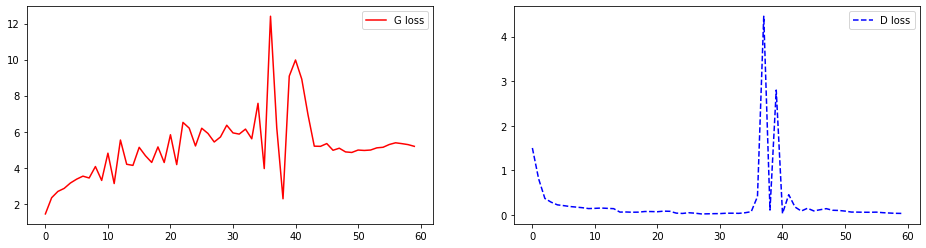

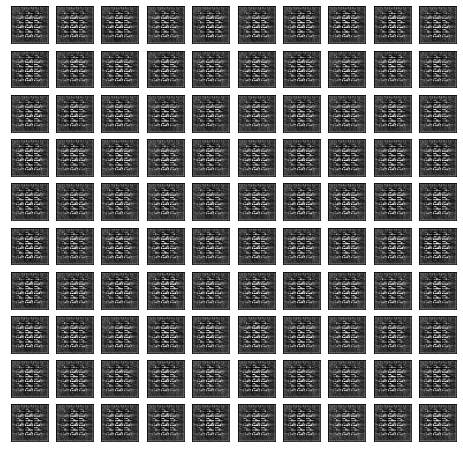

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 2], [training time 37.27]
-------------------------------------------------------------------


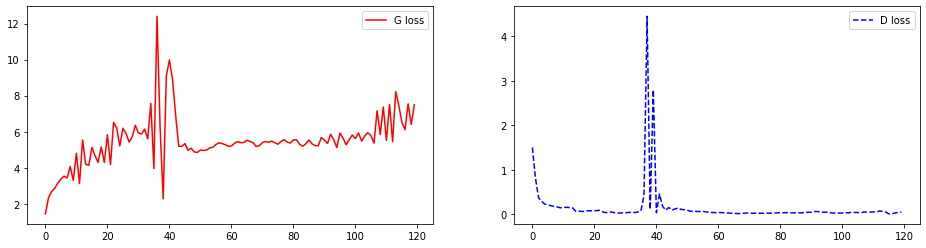

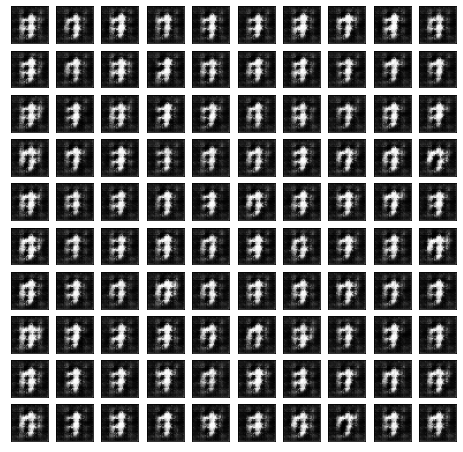

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 3], [training time 38.14]
-------------------------------------------------------------------


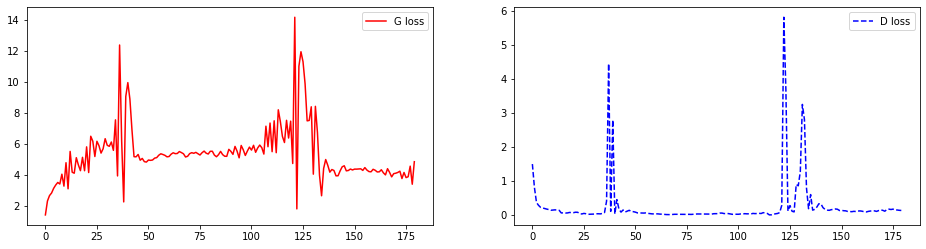

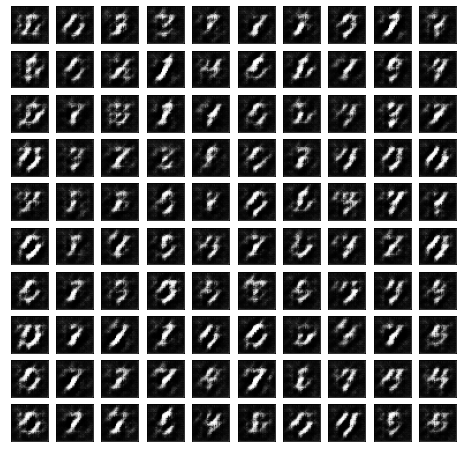

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 4], [training time 37.79]
-------------------------------------------------------------------


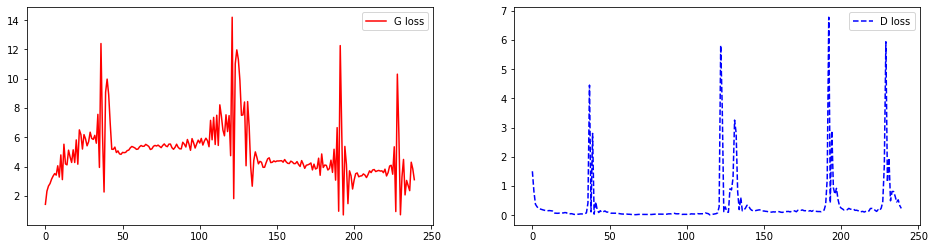

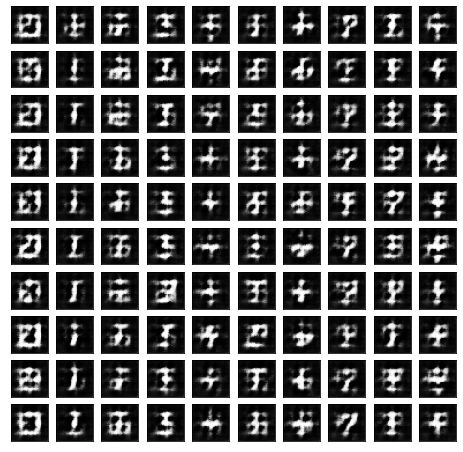

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 5], [training time 37.65]
-------------------------------------------------------------------


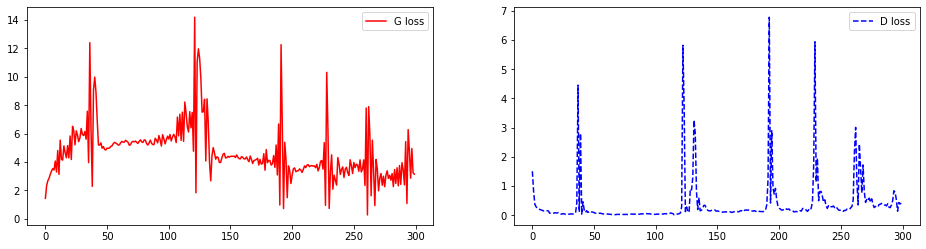

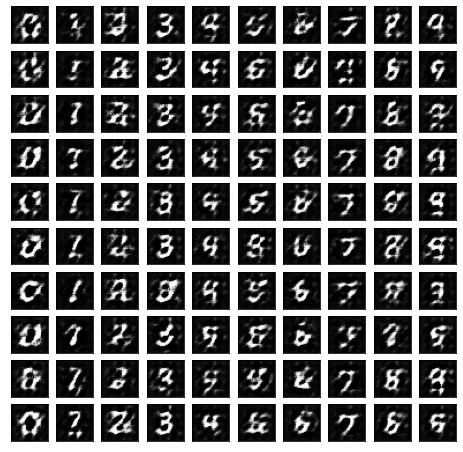

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 6], [training time 39.82]
-------------------------------------------------------------------


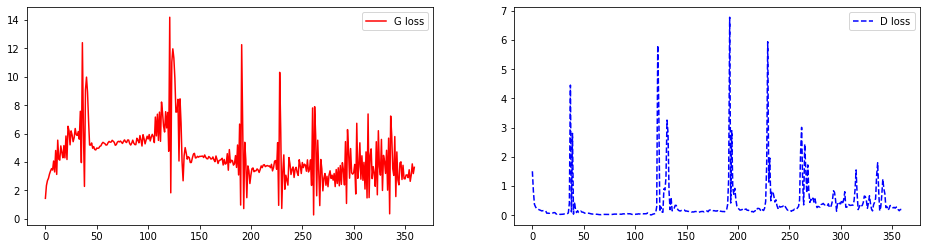

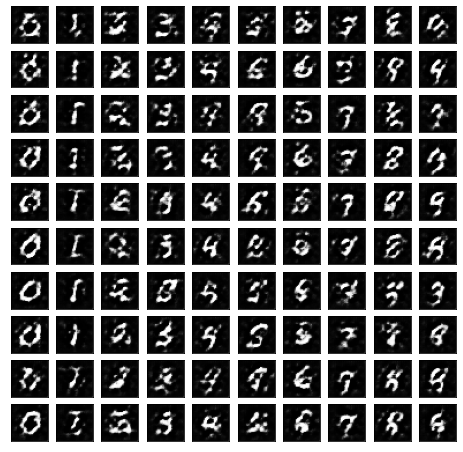

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 7], [training time 38.68]
-------------------------------------------------------------------


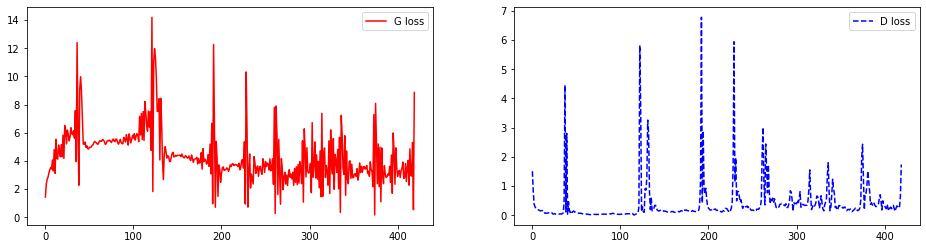

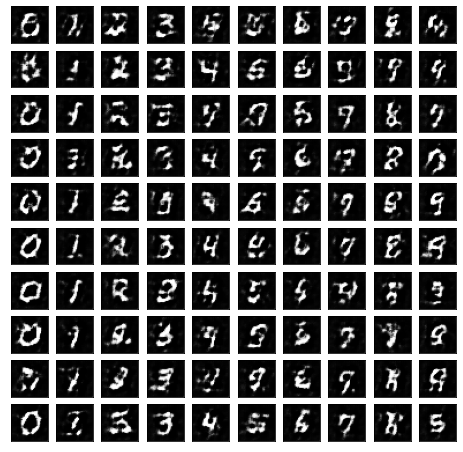

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 8], [training time 37.52]
-------------------------------------------------------------------


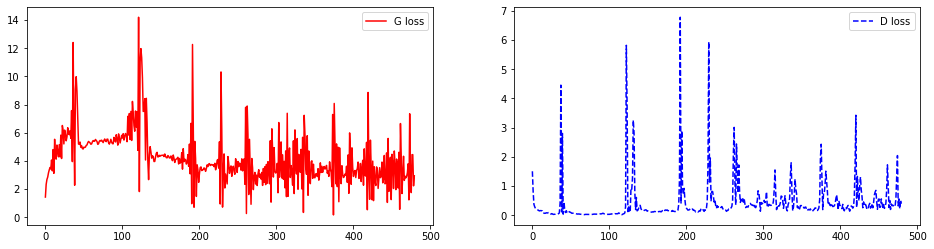

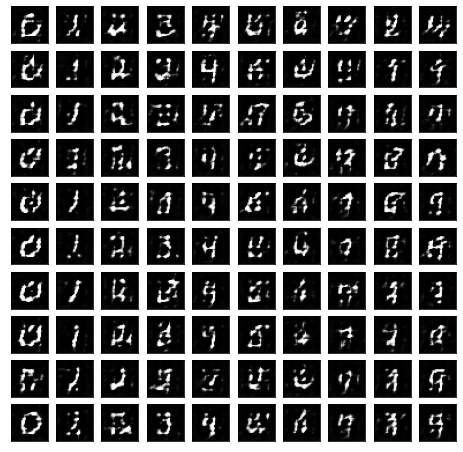

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 9], [training time 37.97]
-------------------------------------------------------------------


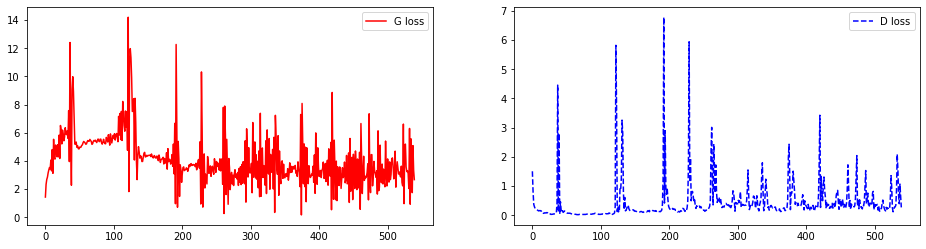

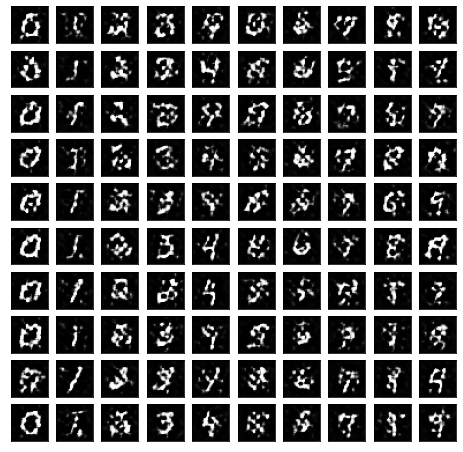

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 10], [training time 37.83]
-------------------------------------------------------------------


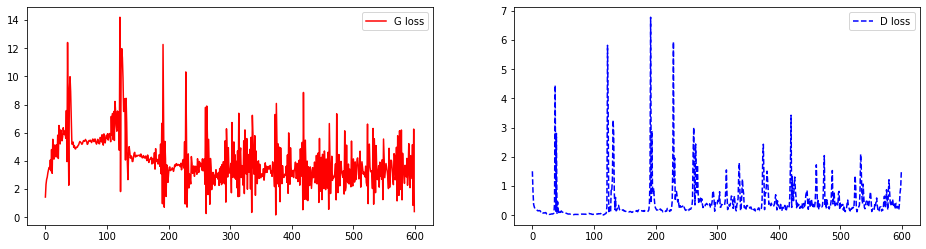

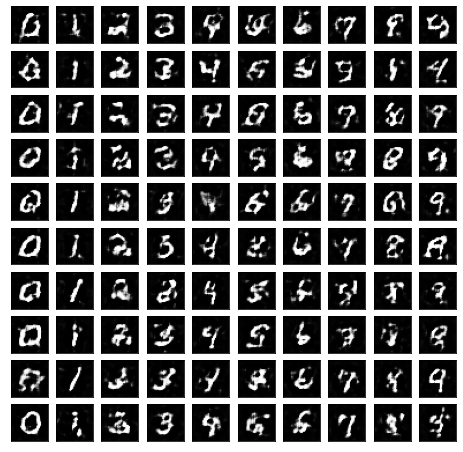

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 11], [training time 37.62]
-------------------------------------------------------------------


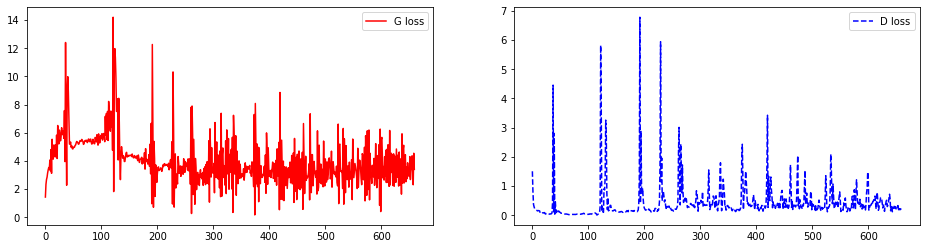

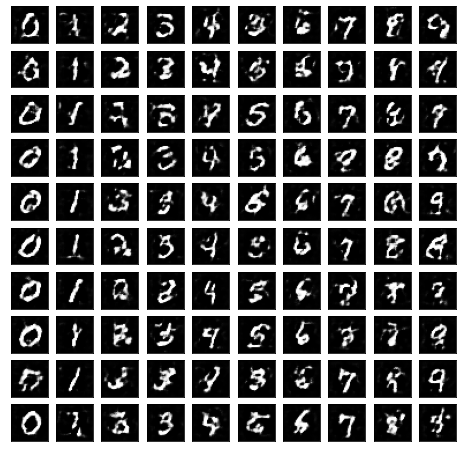

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 12], [training time 37.80]
-------------------------------------------------------------------


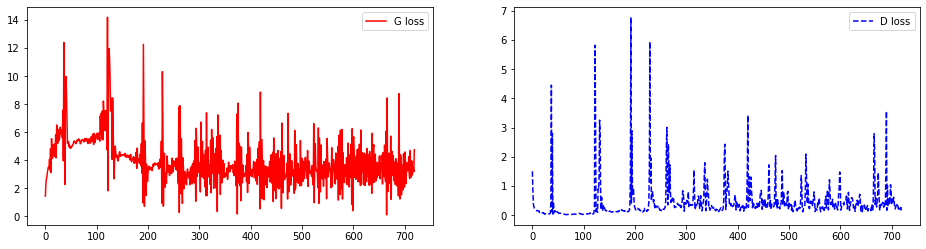

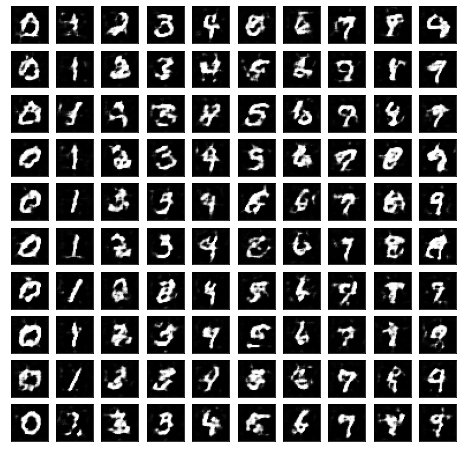

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 13], [training time 37.80]
-------------------------------------------------------------------


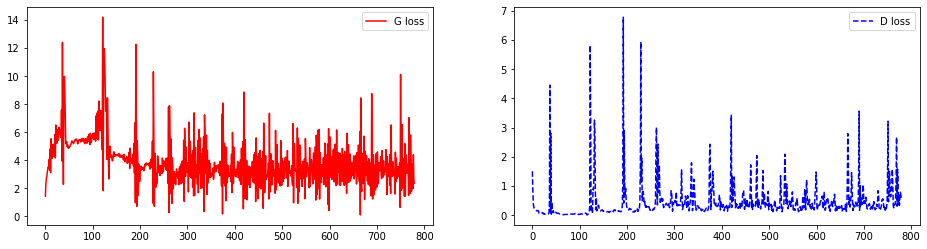

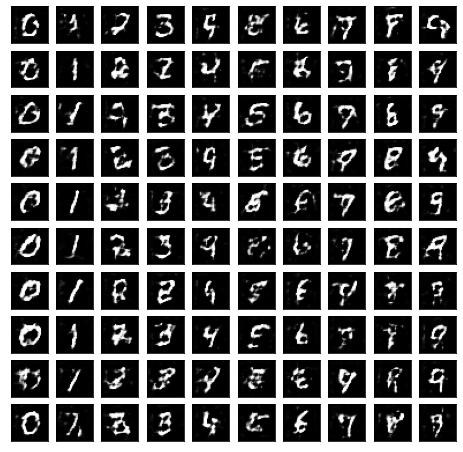

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 14], [training time 37.85]
-------------------------------------------------------------------


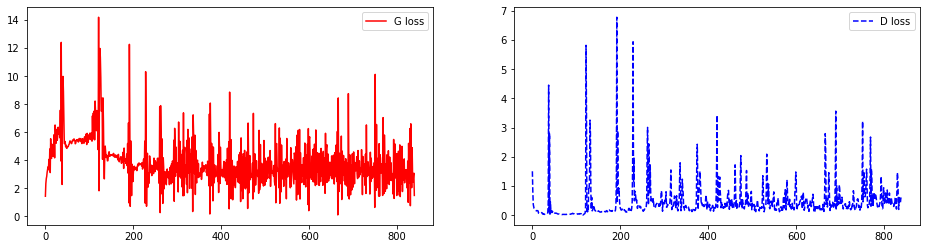

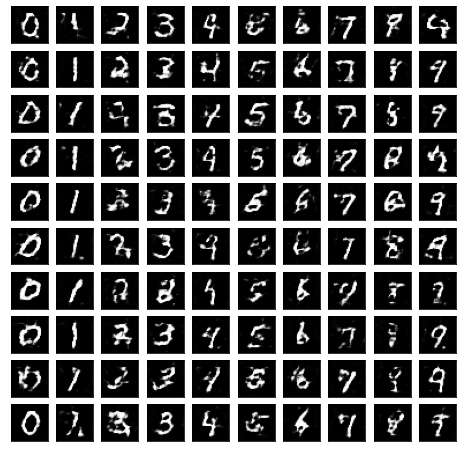

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 15], [training time 37.55]
-------------------------------------------------------------------


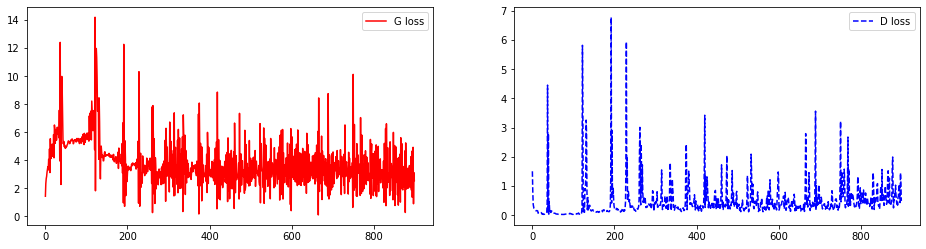

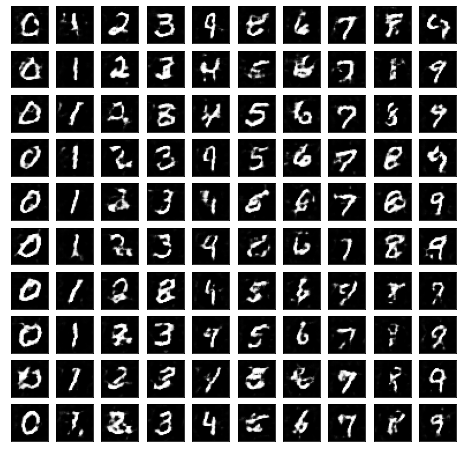

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 16], [training time 37.84]
-------------------------------------------------------------------


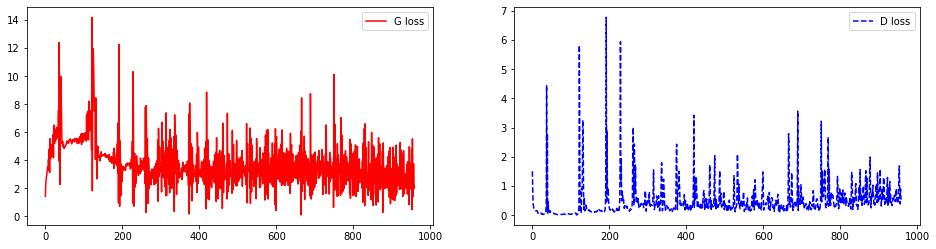

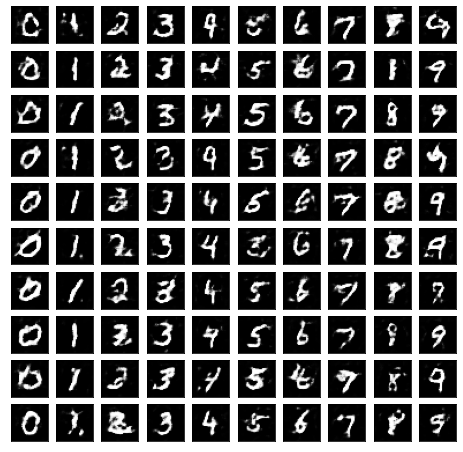

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 17], [training time 37.57]
-------------------------------------------------------------------


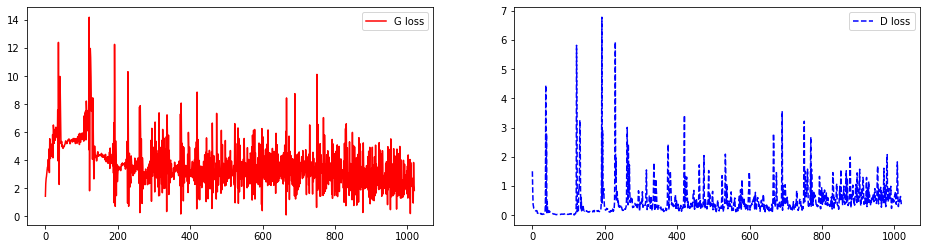

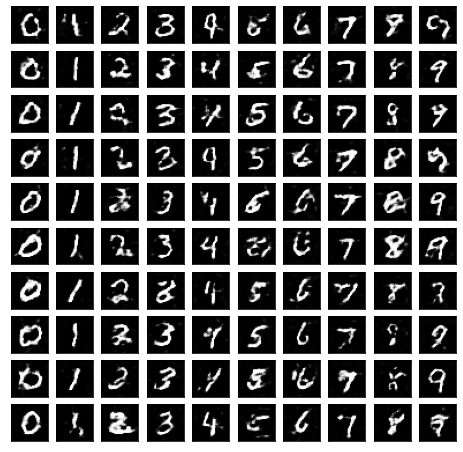

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 18], [training time 37.51]
-------------------------------------------------------------------


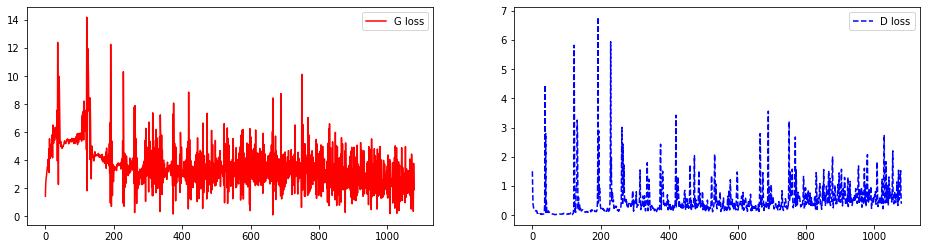

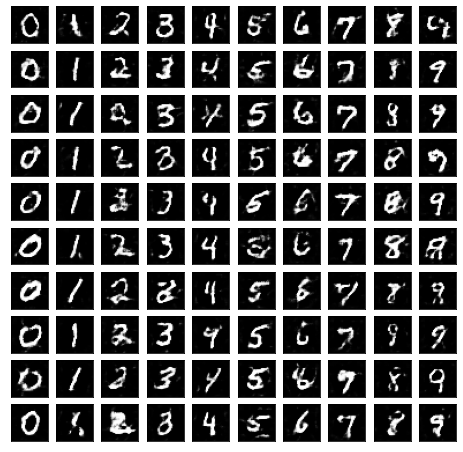

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 19], [training time 37.73]
-------------------------------------------------------------------


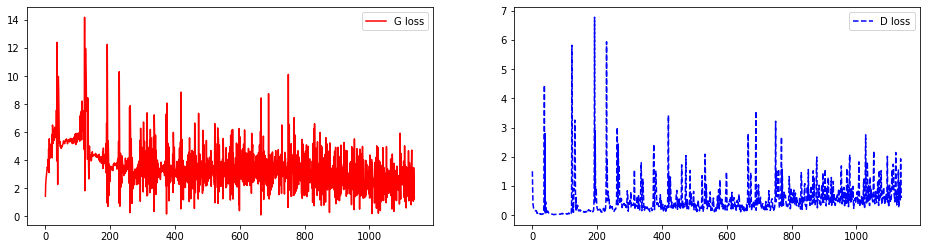

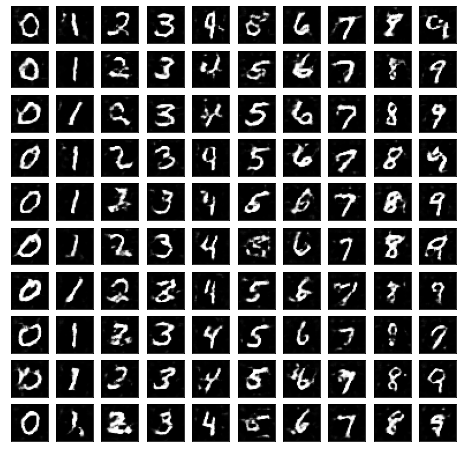

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 20], [training time 37.69]
-------------------------------------------------------------------


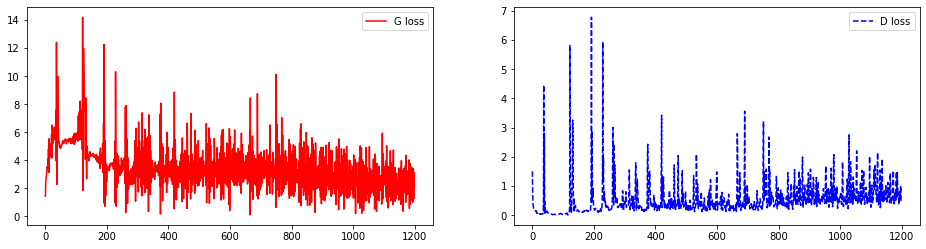

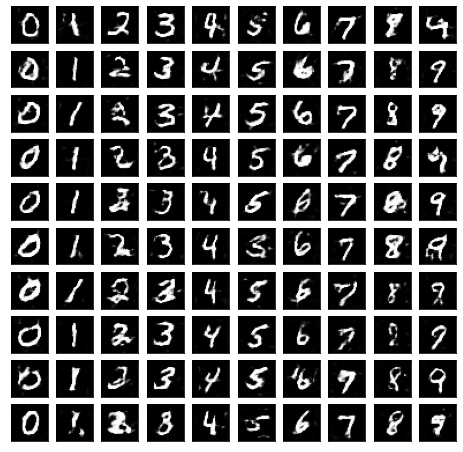

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 21], [training time 37.52]
-------------------------------------------------------------------


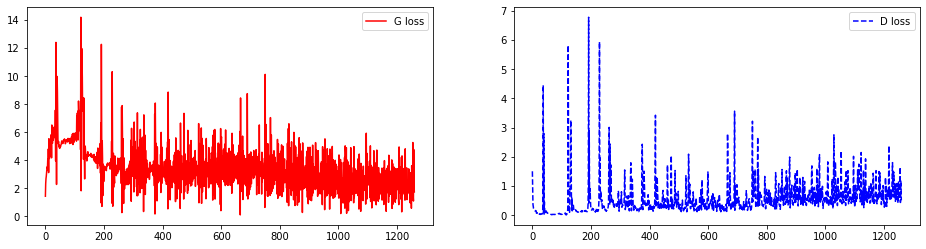

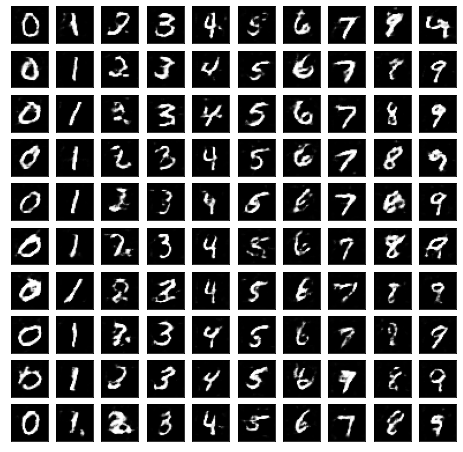

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 22], [training time 37.50]
-------------------------------------------------------------------


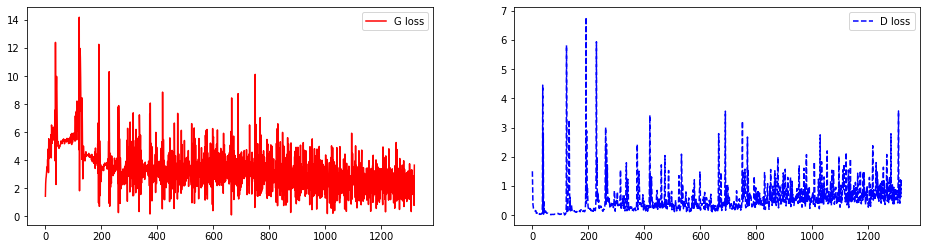

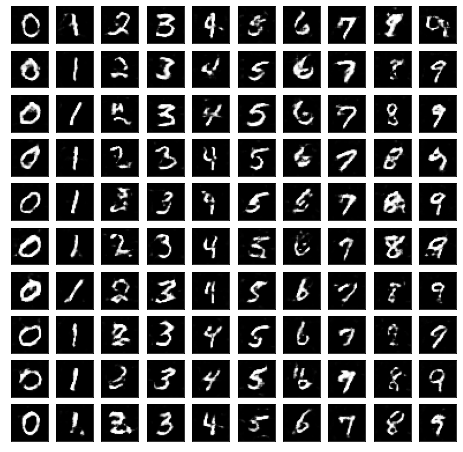

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 23], [training time 37.89]
-------------------------------------------------------------------


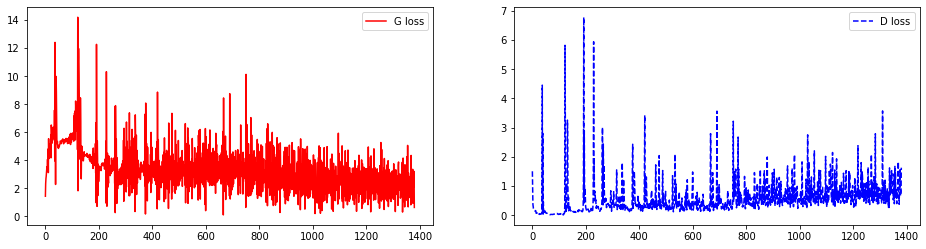

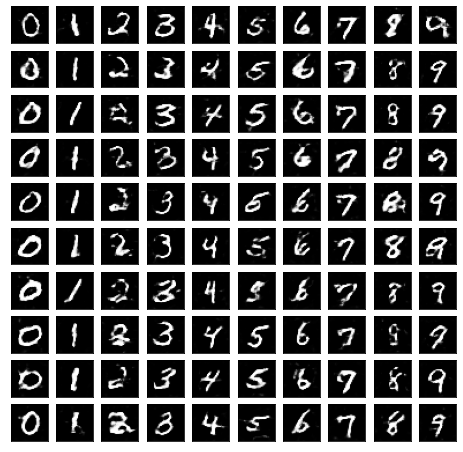

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 24], [training time 37.78]
-------------------------------------------------------------------


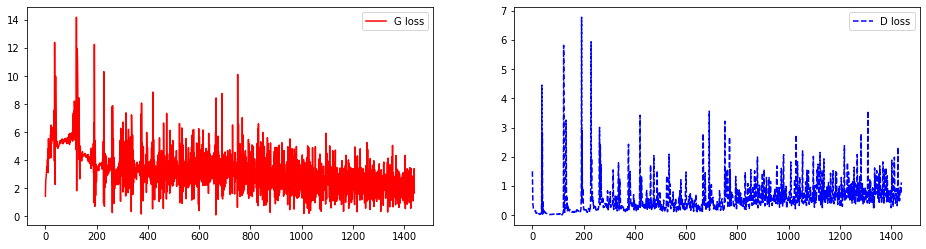

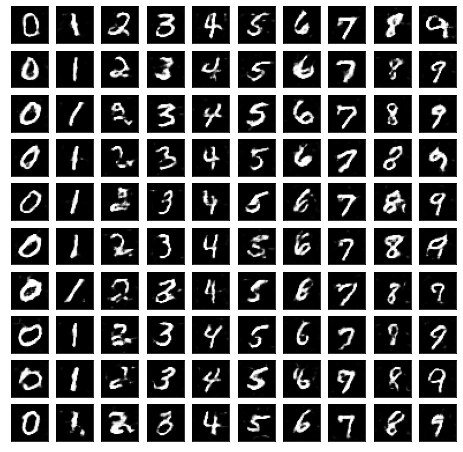

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 25], [training time 37.73]
-------------------------------------------------------------------


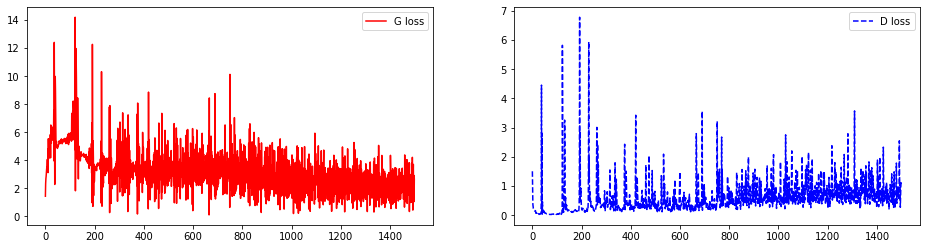

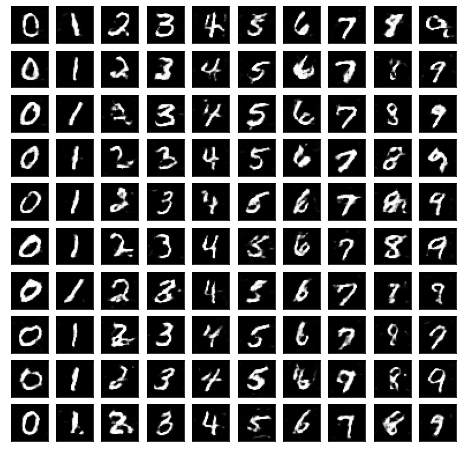

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 26], [training time 37.88]
-------------------------------------------------------------------


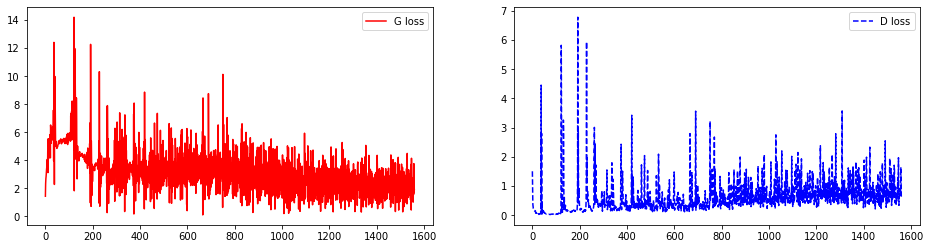

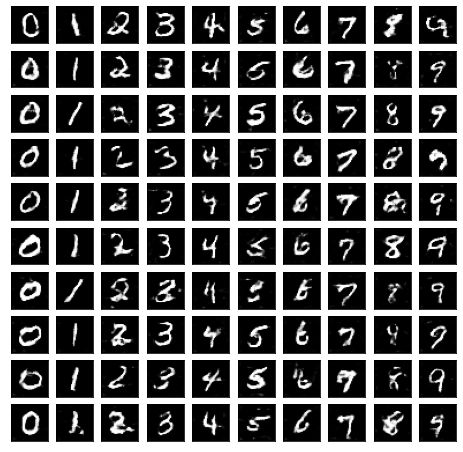

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 27], [training time 37.73]
-------------------------------------------------------------------


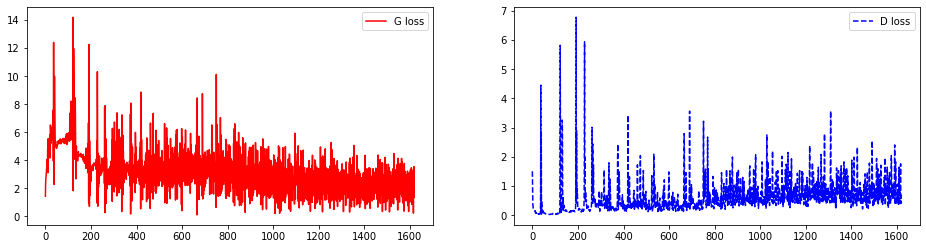

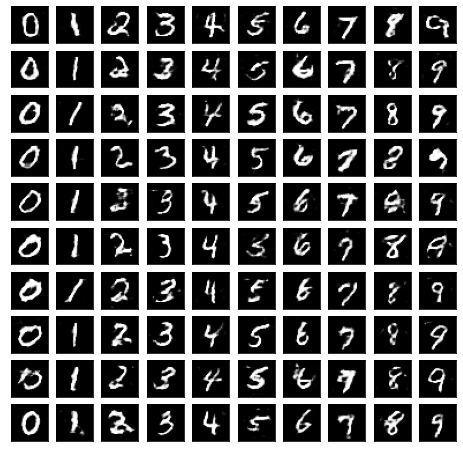

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 28], [training time 37.66]
-------------------------------------------------------------------


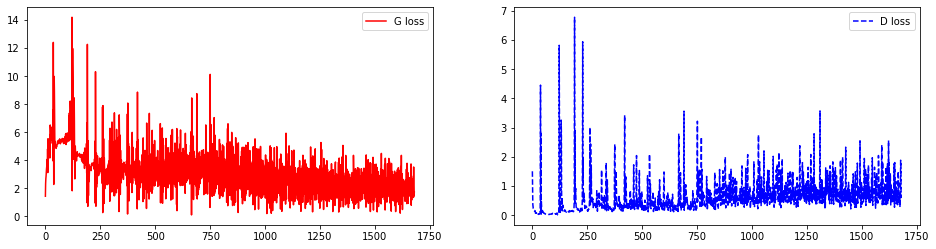

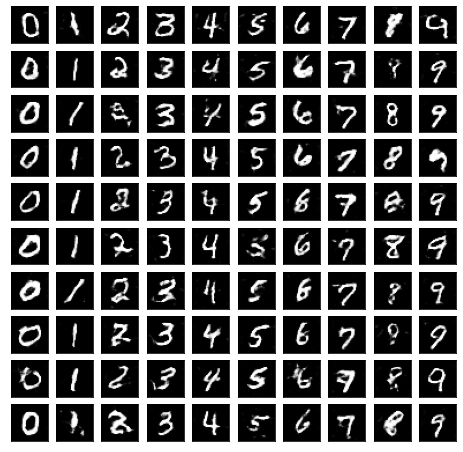

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 29], [training time 37.68]
-------------------------------------------------------------------


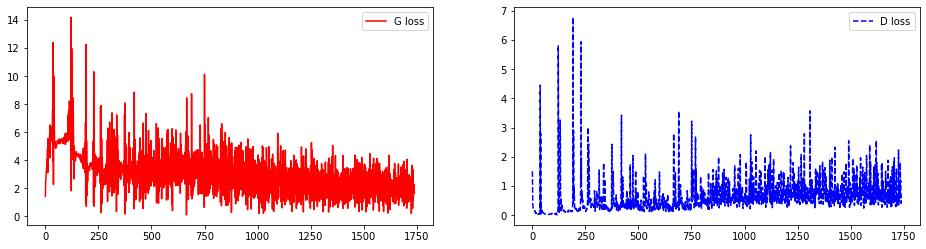

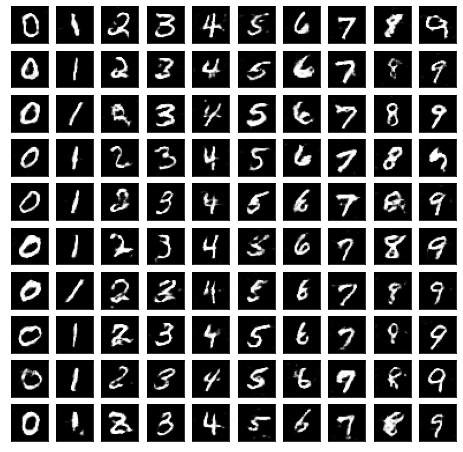

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 30], [training time 37.69]
-------------------------------------------------------------------


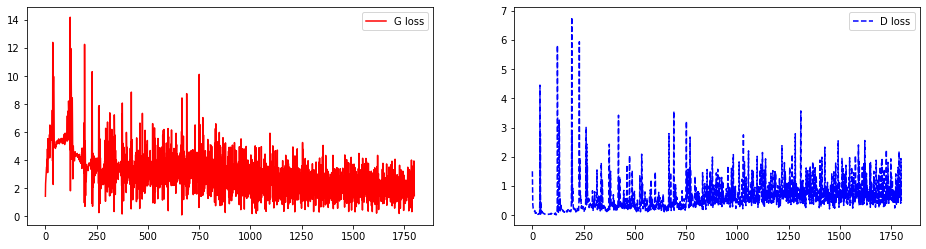

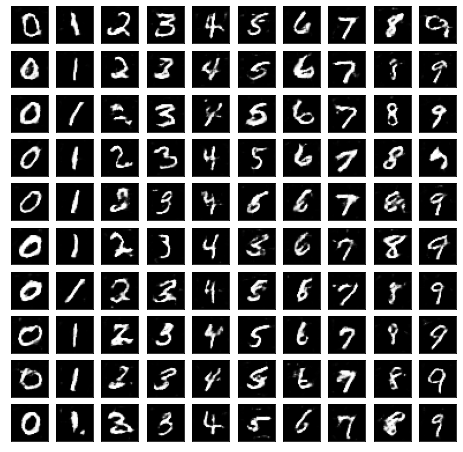

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 31], [training time 37.78]
-------------------------------------------------------------------


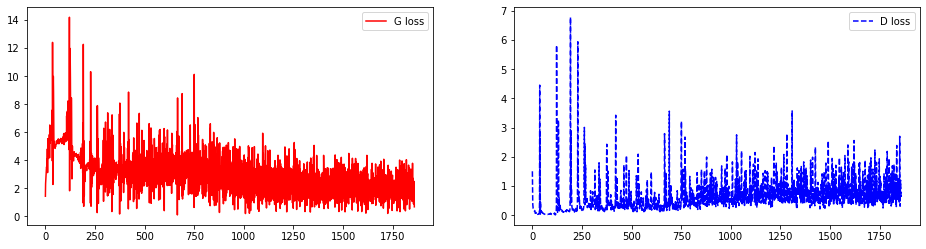

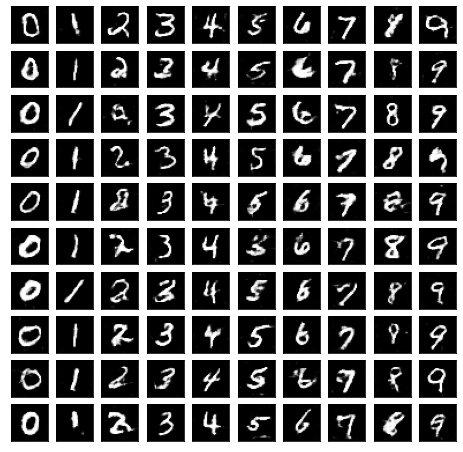

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 32], [training time 37.58]
-------------------------------------------------------------------


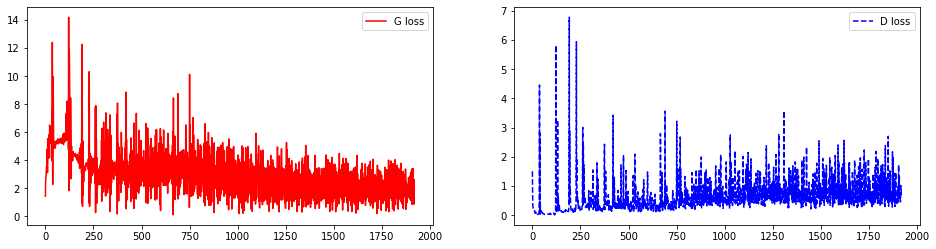

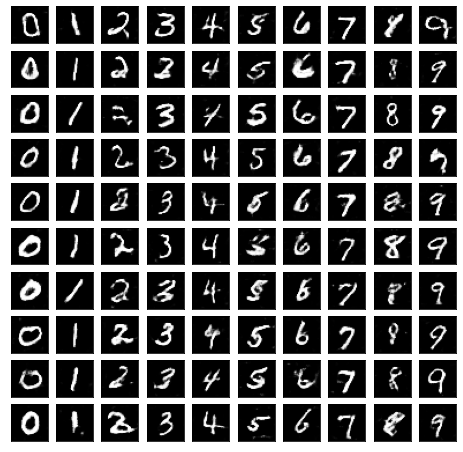

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 33], [training time 37.72]
-------------------------------------------------------------------


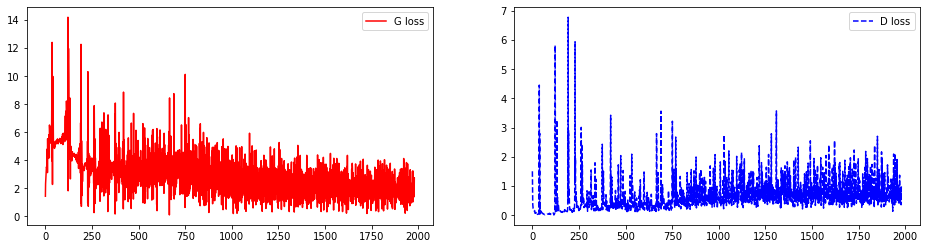

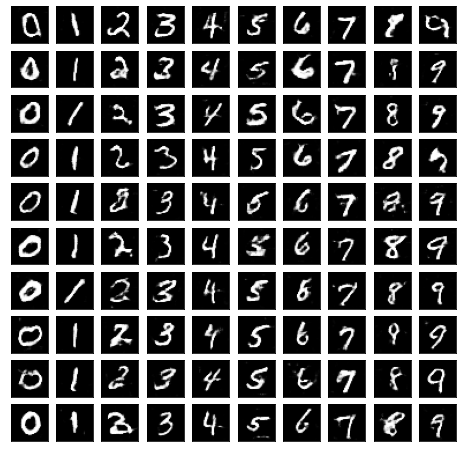

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 34], [training time 37.76]
-------------------------------------------------------------------


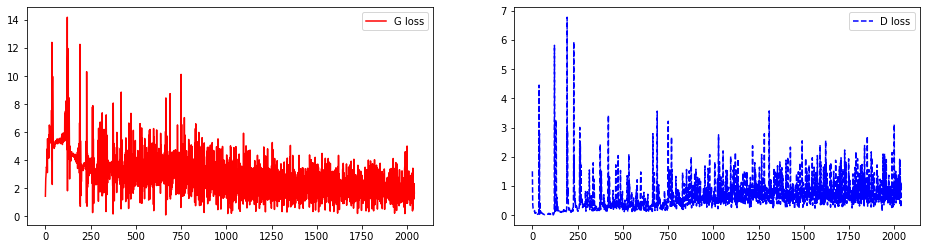

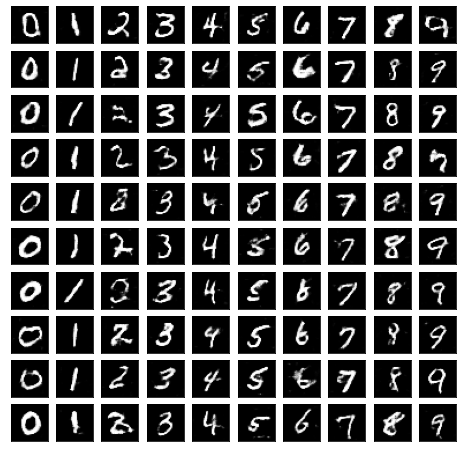

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 35], [training time 37.59]
-------------------------------------------------------------------


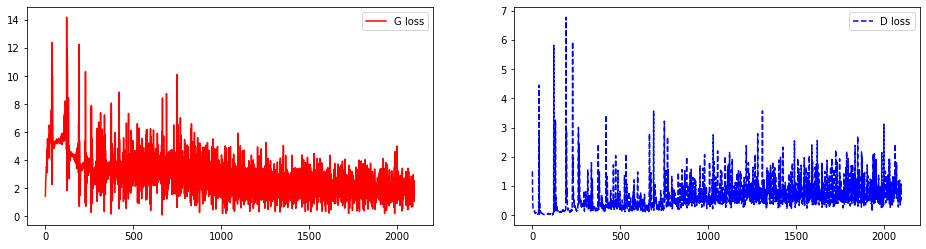

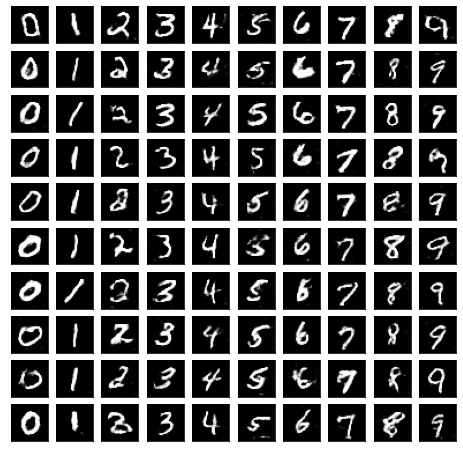

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 36], [training time 37.50]
-------------------------------------------------------------------


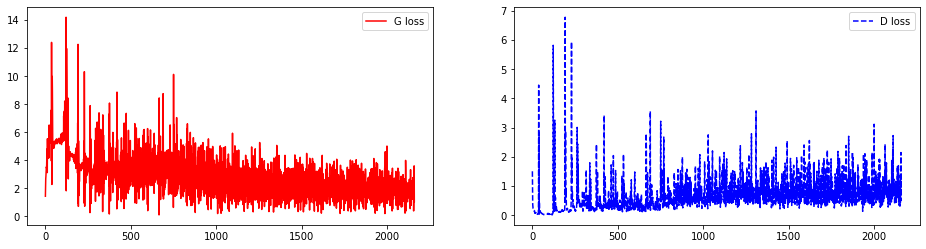

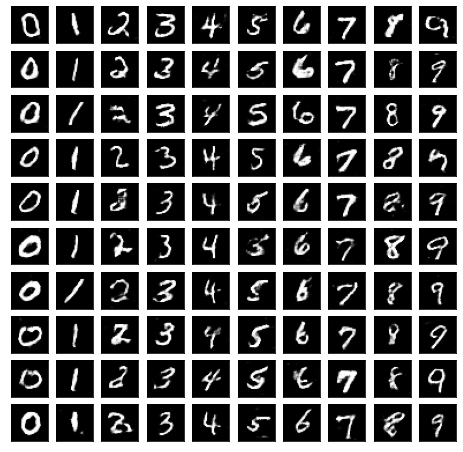

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 37], [training time 37.24]
-------------------------------------------------------------------


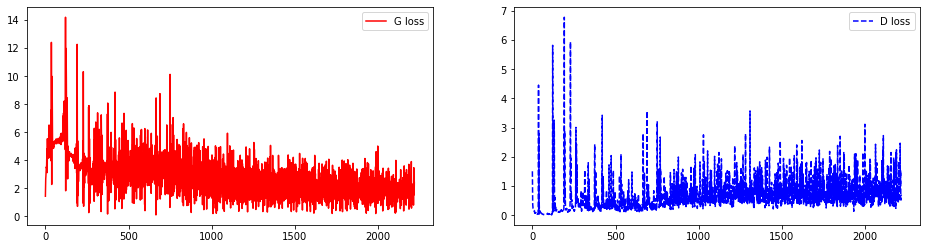

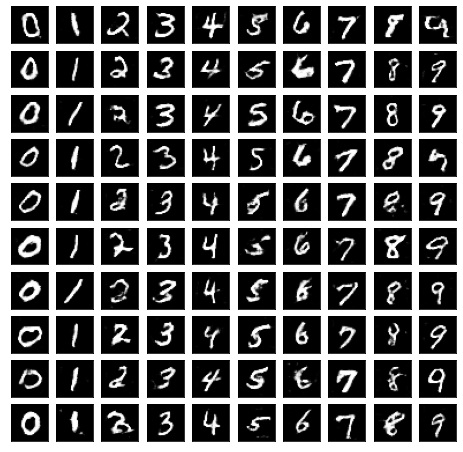

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 38], [training time 37.72]
-------------------------------------------------------------------


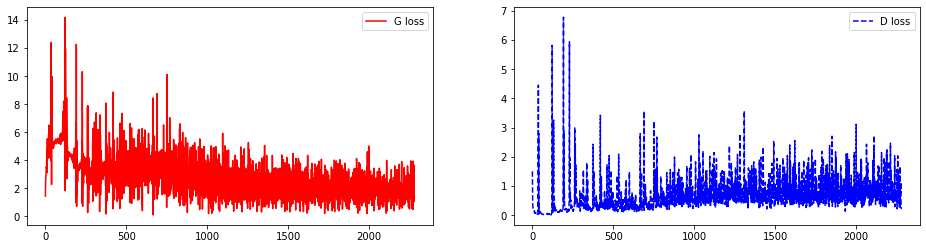

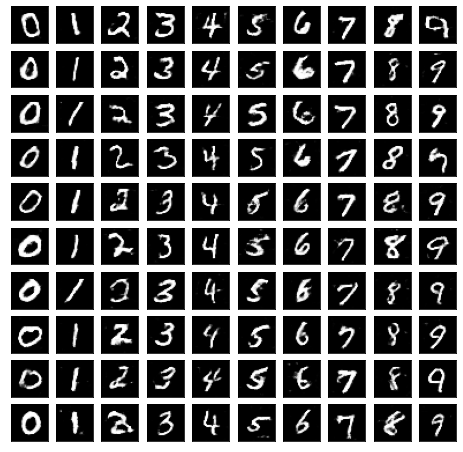

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 39], [training time 37.67]
-------------------------------------------------------------------


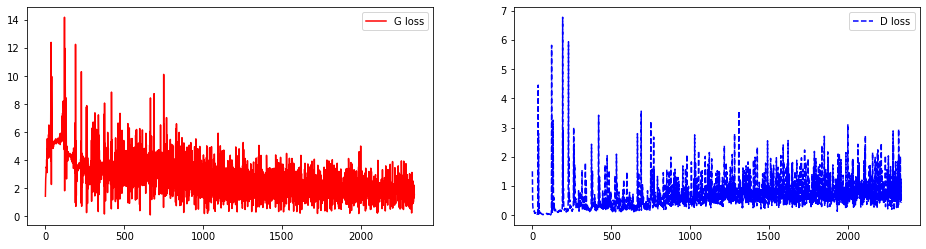

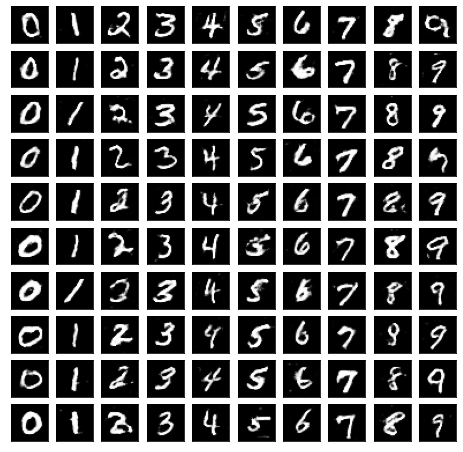

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 40], [training time 37.58]
-------------------------------------------------------------------


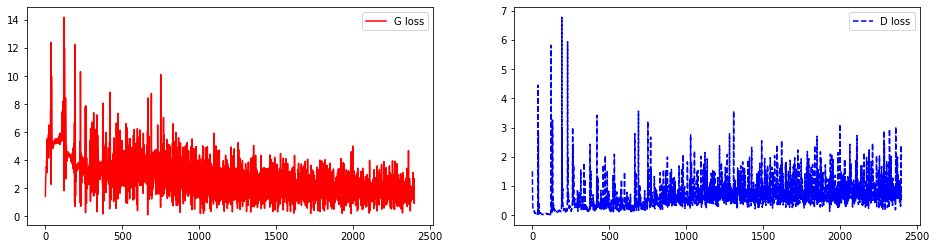

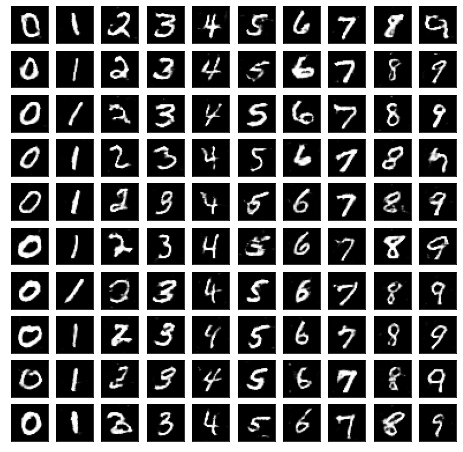

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 41], [training time 38.13]
-------------------------------------------------------------------


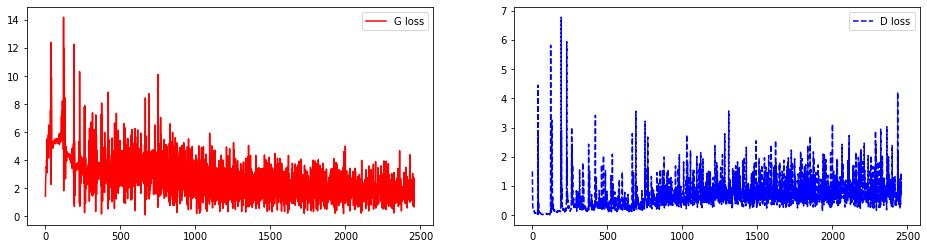

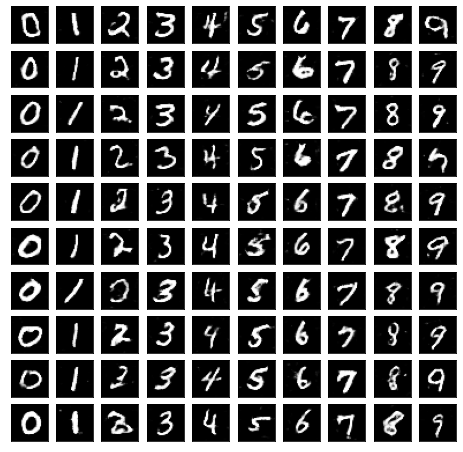

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 42], [training time 37.55]
-------------------------------------------------------------------


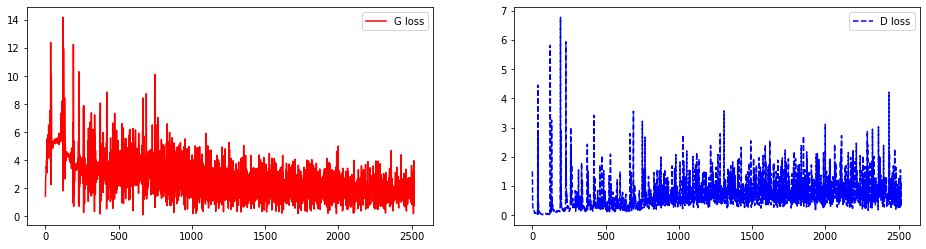

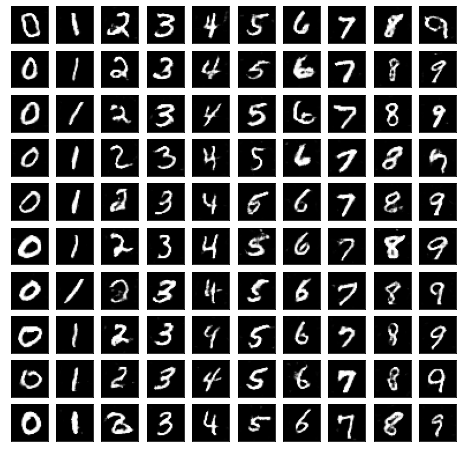

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 43], [training time 37.68]
-------------------------------------------------------------------


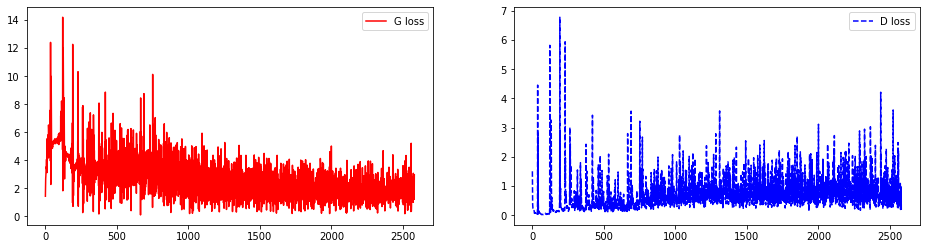

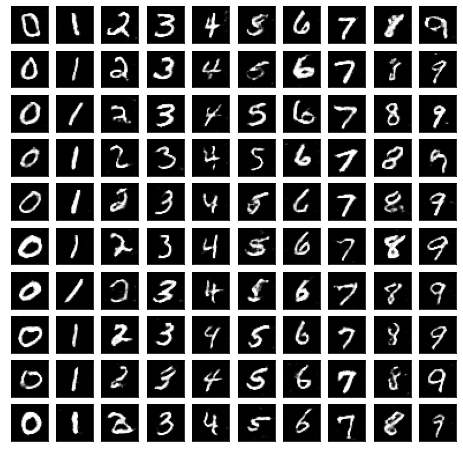

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 44], [training time 37.51]
-------------------------------------------------------------------


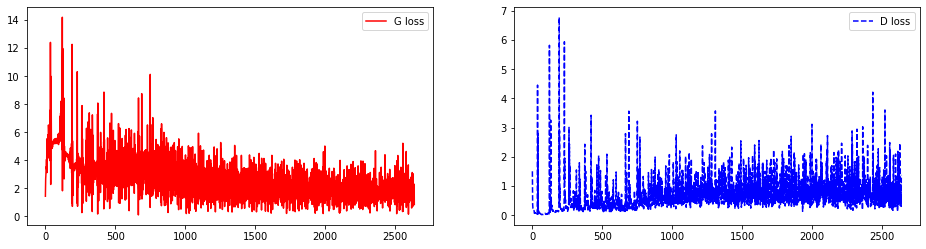

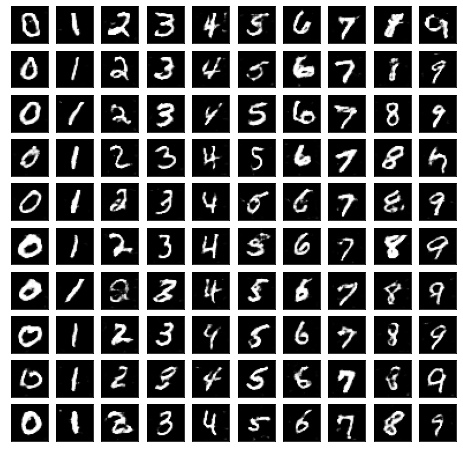

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 45], [training time 37.64]
-------------------------------------------------------------------


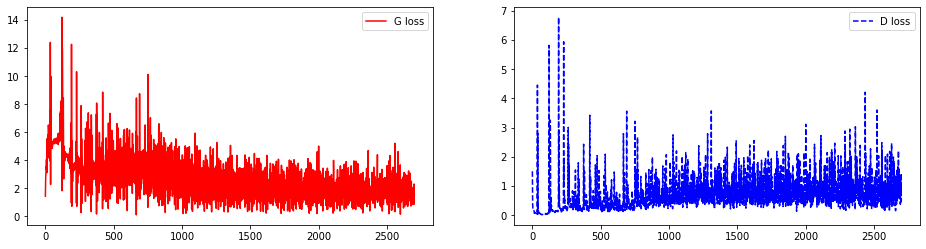

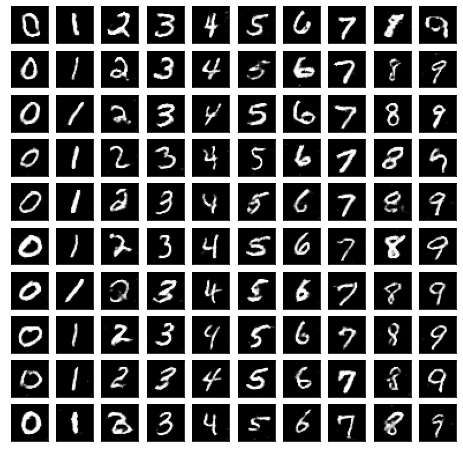

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 46], [training time 37.69]
-------------------------------------------------------------------


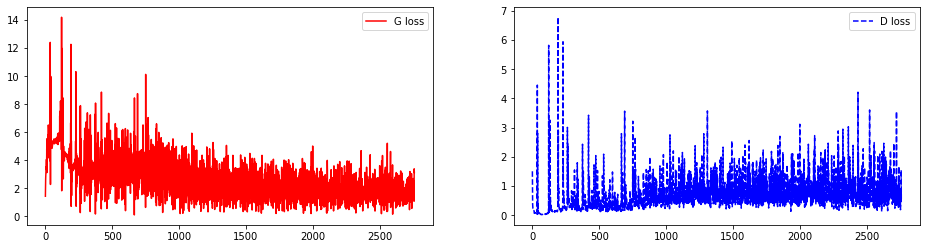

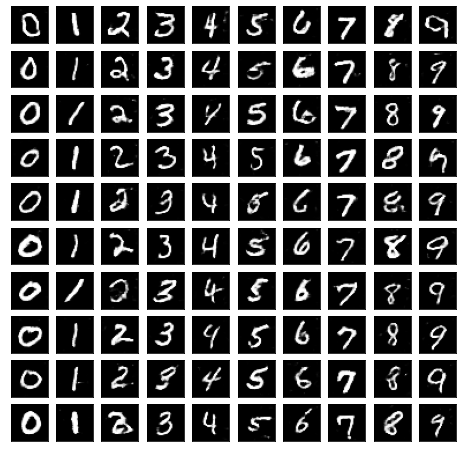

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 47], [training time 37.78]
-------------------------------------------------------------------


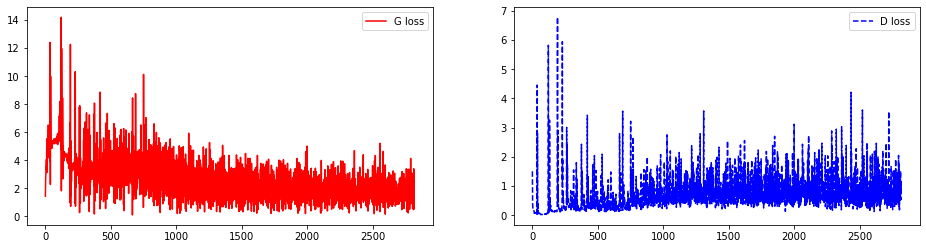

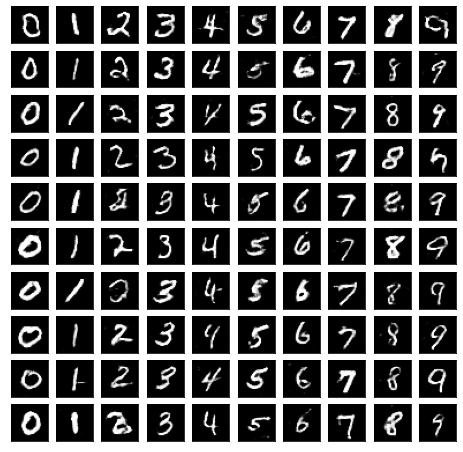

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 48], [training time 37.77]
-------------------------------------------------------------------


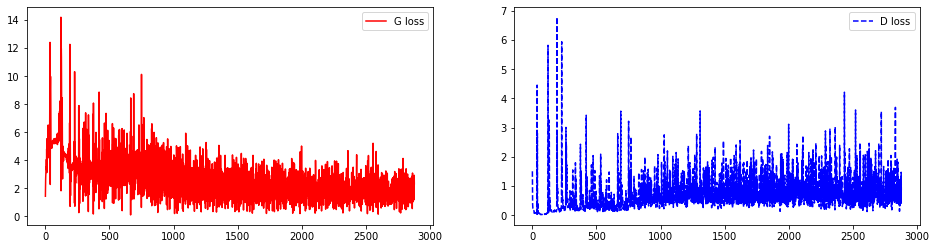

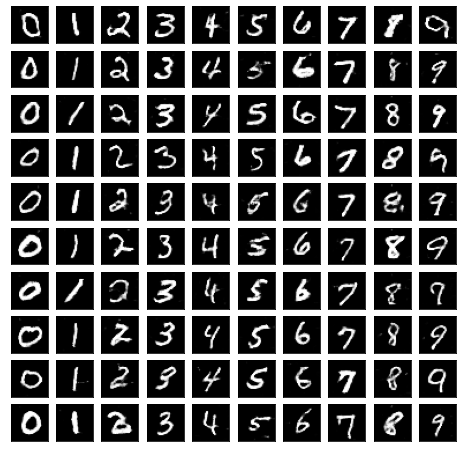

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 49], [training time 37.68]
-------------------------------------------------------------------


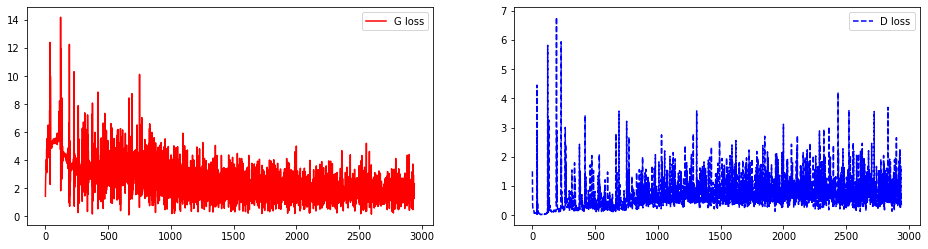

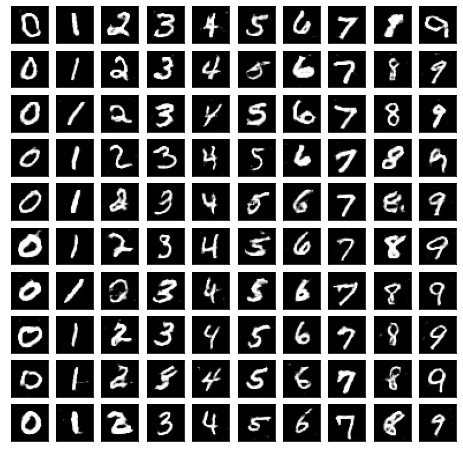

/usr/local/lib/python3.8/dist-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


-------------------------------------------------------------------
[epoch 50], [training time 37.57]
-------------------------------------------------------------------


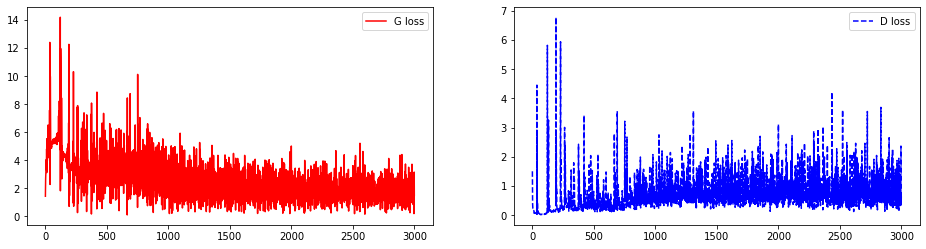

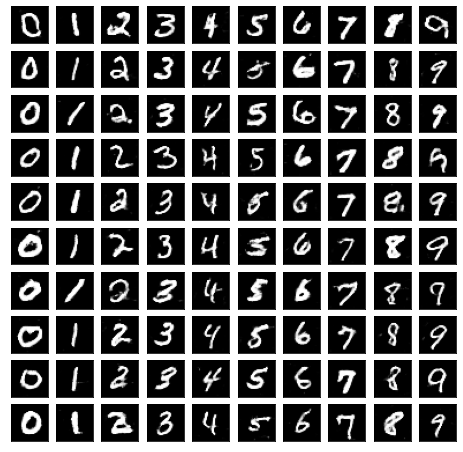

In [11]:
# Lists for losses.
train_loss_G = []
train_loss_D = []

# Creating random vector z.
sample_z = torch.randn((args['n_samples'] * args['n_samples'],
                        args['z_dim'],
                        args['z_size'],
                        args['z_size'])).to(args['device']) # MNIST

fake_labs = torch.randint_like(torch.zeros((args['n_samples'] * args['n_samples'])),
                               high=10,
                               dtype=torch.long).to(args['device'])
for cl in range(args['n_classes']):
    fake_labs[cl::args['n_classes']] = cl

one_hot_g, one_hot_d = one_hot_encodings(fake_labs,
                                         args['n_samples'] * args['n_samples'],
                                         args['n_classes'],
                                         args['img_size'],
                                         args['z_size'])

sample_z = torch.cat([sample_z, one_hot_g], axis=1)

# Iterating over epochs.
for epoch in range(1, args['epoch_num'] + 1):

    # Training function.
    train_loss_G, train_loss_D = train(train_loader,
                                       net_G, net_D,
                                       opt_G, opt_D,
                                       train_loss_G, train_loss_D,
                                       criterion,
                                       epoch)

    if epoch % args['print_freq'] == 0:
        
        # Testing function for sample generation.
        evaluate(net_G, criterion, epoch, sample_z)